In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

In [12]:
N = 200              # number of birds
L = 10.0             # box size
r = 1.0              # interaction radius
eta = 0.2            # noise strength
v = 0.03             # speed
dt = 1.0             # time step
steps = 500          # simulation steps
updaten = 5          # timestep for one plot update

In [13]:
def update(frame):
    global pos, theta
    for _ in range(updaten):
        # Periodic distance calculation
        dx = pos[:, np.newaxis, :] - pos[np.newaxis, :, :]
        dx = dx - L * np.round(dx / L)
        dist = np.sqrt((dx**2).sum(axis=2))

        new_theta = np.zeros(N)
        for i in range(N):
            neighbors = dist[i] < r
            mean_angle = np.arctan2(
                np.sin(theta[neighbors]).mean(),
                np.cos(theta[neighbors]).mean()
            )
            new_theta[i] = mean_angle + eta*(np.random.random()-0.5)

        theta = new_theta

        pos[:, 0] += v*np.cos(theta)
        pos[:, 1] += v*np.sin(theta)
        pos %= L

    ax.clear()
    ax.quiver(pos[:, 0], pos[:, 1],
              np.cos(theta), np.sin(theta),
              angles='xy', scale_units='xy', scale=10)
    ax.set_xlim(0, L)
    ax.set_ylim(0, L)
    ax.set_title(f"Step {frame}")


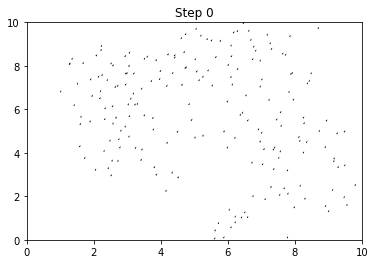

In [14]:
pos = np.random.random((N, 2)) * L
theta = np.random.random(N) * 2 * np.pi
fig, ax = plt.subplots()
ani = FuncAnimation(fig, update, frames=steps, interval=50)
HTML(ani.to_jshtml())